# Novartis DRUG-seq Drug Perturbation Associations
This notebook contains the script used to process the Novartis DRUG-seq Drug Perturbation Associations dataset for Harmonizome. The differential exression data obtained from Novartis was pre-rocessed internally in the Ma'ayan lab prior to processing.

The metadata used to describe the drug perturbations was sourced from the [Novartis DRUG-seq Github repo](https://github.com/Novartis/DRUG-seq/blob/main/data/Novartis_drugseq_U2OS_MoABox/MoABox_compounds_metadata.txt) and [DRUG-seqr](https://drugseqr.maayanlab.cloud/). Associations with an adjusted p-value of < 0.05 were kept and direction was determined by direction of logFC.

In [1]:
import pandas as pd
import datetime
import goenrich
import matplotlib.pyplot as plt
import numpy as np
import scipy.spatial.distance as dist
import seaborn as sns
import sys
from tqdm import tqdm
import json
import scanpy as sc

from sklearn.feature_extraction.text import TfidfVectorizer
import anndata
from collections import OrderedDict

# Bokeh
from bokeh.io import output_notebook
from bokeh.plotting import figure, show, save, output_file
from bokeh.models import HoverTool, ColumnDataSource
from bokeh.palettes import Category20
output_notebook()

from IPython.display import display, HTML, Markdown
sys.setrecursionlimit(100000)

Loading BokehJS ...

## Load and Pre-Process Data

In [2]:
novartis = pd.read_csv('edge_list_harmonizome.csv.gz', compression='gzip')
novartis['Sample'] = novartis['Perturbation'].map(lambda x: x.split(' ')[0]).map(lambda x: '_'.join(x.split('_')[1:3]))
novartis

,Gene,Perturbation,P.Adj,LogFC,Sample
0,COX5B,SA_AF-80-QK39_0.01uM_24.0_batchid1 vs RC_CB-43...,1.922508e-07,5.351373e-01,AF-80-QK39_0.01uM
1,APRT,SA_AF-80-QK39_0.01uM_24.0_batchid1 vs RC_CB-43...,1.922508e-07,8.386325e-01,AF-80-QK39_0.01uM
2,MCM4,SA_AF-80-QK39_0.01uM_24.0_batchid1 vs RC_CB-43...,3.703625e-07,1.658912e+00,AF-80-QK39_0.01uM
3,NDUFA11,SA_AF-80-QK39_0.01uM_24.0_batchid1 vs RC_CB-43...,9.669733e-05,5.320098e-01,AF-80-QK39_0.01uM
4,FAU,SA_AF-80-QK39_0.01uM_24.0_batchid1 vs RC_CB-43...,1.524288e-04,5.095256e-01,AF-80-QK39_0.01uM
...,...,...,...,...,...
203216287,ANO9,SA_GC-86-TD91_0.01uM_24.0_batchid9 vs RC_CB-43...,1.000000e+00,-3.469447e-18,GC-86-TD91_0.01uM
203216288,ALLC,SA_GC-86-TD91_0.01uM_24.0_batchid9 vs RC_CB-43...,1.000000e+00,8.673617e-19,GC-86-TD91_0.01uM
203216289,ADGRA1,SA_GC-86-TD91_0.01uM_24.0_batchid9 vs RC_CB-43...,1.000000e+00,0.000000e+00,GC-86-TD91_0.01uM
203216290,ACSBG1,SA_GC-86-TD91_0.01uM_24.0_batchid9 vs RC_CB-43...,1.000000e+00,-1.665335e-16,GC-86-TD91_0.01uM


In [3]:
novartis[(novartis['P.Adj']<=0.049999) & (novartis['LogFC'].abs()>=1)].sort_values('P.Adj').groupby('Perturbation')['Gene'].count().mean()/2

78.09756706175921

In [4]:
def thresh(score):
    if score > 0:
        return 1
    elif score < 0:
        return -1
    return score

#novartis['Score'] = novartis['P.Adj'].replace(0, 1e-322).map(np.log) * -1 * novartis['LogFC'].map(thresh).replace(-0,0)
novartis

,Gene,Perturbation,P.Adj,LogFC,Sample
0,COX5B,SA_AF-80-QK39_0.01uM_24.0_batchid1 vs RC_CB-43...,1.922508e-07,5.351373e-01,AF-80-QK39_0.01uM
1,APRT,SA_AF-80-QK39_0.01uM_24.0_batchid1 vs RC_CB-43...,1.922508e-07,8.386325e-01,AF-80-QK39_0.01uM
2,MCM4,SA_AF-80-QK39_0.01uM_24.0_batchid1 vs RC_CB-43...,3.703625e-07,1.658912e+00,AF-80-QK39_0.01uM
3,NDUFA11,SA_AF-80-QK39_0.01uM_24.0_batchid1 vs RC_CB-43...,9.669733e-05,5.320098e-01,AF-80-QK39_0.01uM
4,FAU,SA_AF-80-QK39_0.01uM_24.0_batchid1 vs RC_CB-43...,1.524288e-04,5.095256e-01,AF-80-QK39_0.01uM
...,...,...,...,...,...
203216287,ANO9,SA_GC-86-TD91_0.01uM_24.0_batchid9 vs RC_CB-43...,1.000000e+00,-3.469447e-18,GC-86-TD91_0.01uM
203216288,ALLC,SA_GC-86-TD91_0.01uM_24.0_batchid9 vs RC_CB-43...,1.000000e+00,8.673617e-19,GC-86-TD91_0.01uM
203216289,ADGRA1,SA_GC-86-TD91_0.01uM_24.0_batchid9 vs RC_CB-43...,1.000000e+00,0.000000e+00,GC-86-TD91_0.01uM
203216290,ACSBG1,SA_GC-86-TD91_0.01uM_24.0_batchid9 vs RC_CB-43...,1.000000e+00,-1.665335e-16,GC-86-TD91_0.01uM


In [5]:
gene_info = pd.read_csv('../../tables/Homo_sapiens.gene_info.gz', sep='\t', compression='gzip')
gene_info = gene_info[(gene_info['#tax_id']==9606) & (gene_info['type_of_gene']=='protein-coding')]
gene_info['Symbol'] = gene_info['Symbol'].map(str.upper)
gene_info

,#tax_id,GeneID,Symbol,LocusTag,Synonyms,dbXrefs,chromosome,map_location,description,type_of_gene,Symbol_from_nomenclature_authority,Full_name_from_nomenclature_authority,Nomenclature_status,Other_designations,Modification_date,Feature_type
0,9606,1,A1BG,-,A1B|ABG|GAB|HYST2477,MIM:138670|HGNC:HGNC:5|Ensembl:ENSG00000121410...,19,19q13.43,alpha-1-B glycoprotein,protein-coding,A1BG,alpha-1-B glycoprotein,O,alpha-1B-glycoprotein|HEL-S-163pA|epididymis s...,20250407,-
1,9606,2,A2M,-,A2MD|CPAMD5|FWP007|S863-7,MIM:103950|HGNC:HGNC:7|Ensembl:ENSG00000175899...,12,12p13.31,alpha-2-macroglobulin,protein-coding,A2M,alpha-2-macroglobulin,O,alpha-2-macroglobulin|C3 and PZP-like alpha-2-...,20250407,-
3,9606,9,NAT1,-,AAC1|MNAT|NAT-1|NATI,MIM:108345|HGNC:HGNC:7645|Ensembl:ENSG00000171...,8,8p22,N-acetyltransferase 1,protein-coding,NAT1,N-acetyltransferase 1,O,arylamine N-acetyltransferase 1|N-acetyltransf...,20250407,-
4,9606,10,NAT2,-,AAC2|NAT-2|PNAT,MIM:612182|HGNC:HGNC:7646|Ensembl:ENSG00000156...,8,8p22,N-acetyltransferase 2,protein-coding,NAT2,N-acetyltransferase 2,O,arylamine N-acetyltransferase 2|N-acetyltransf...,20250407,-
6,9606,12,SERPINA3,-,AACT|ACT|GIG24|GIG25,MIM:107280|HGNC:HGNC:16|Ensembl:ENSG0000019613...,14,14q32.13,serpin family A member 3,protein-coding,SERPINA3,serpin family A member 3,O,alpha-1-antichymotrypsin|cell growth-inhibitin...,20250407,-
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
193253,9606,134826889,SPESP1-NOX5,-,-,Ensembl:ENSG00000290203,15,-,SPESP1-NOX5 readthrough,protein-coding,-,-,-,SPESP1-NOX5 readthrough,20241022,-
193276,9606,138304584,DDX11L13,-,-,HGNC:HGNC:37112|AllianceGenome:HGNC:37112,20,-,DEAD/H-box helicase 11 like 13,protein-coding,DDX11L13,DEAD/H-box helicase 11 like 13,O,DEAD/H-box helicase 11 like 13|DEAD/H (Asp-Glu...,20241227,-
193352,9606,139355219,KIAA1191-AS1,-,-,HGNC:HGNC:41234,5,5q35.2,KIAA1191 antisense RNA 1,protein-coding,KIAA1191-AS1,KIAA1191 antisense RNA 1,O,-,20250131,-
193384,9606,139427322,LOC139427322,-,-,-,-,-,uncharacterized LOC139427322,protein-coding,-,-,-,uncharacterized LOC139427322,20250220,-


In [6]:
synonyms = gene_info.copy()
synonyms['Synonyms'] = synonyms.apply(lambda x: x['Synonyms'].upper().split('|') + [x['Symbol']], axis=1)
synonyms = synonyms.explode('Synonyms')
synonyms = synonyms[synonyms['Synonyms']!='-']
synonyms = synonyms.set_index('Synonyms')['Symbol'].to_dict()

In [7]:
novartis['Gene'] = novartis['Gene'].map(str.upper).map(synonyms)
novartis = novartis.dropna()
novartis

,Gene,Perturbation,P.Adj,LogFC,Sample
0,COX5B,SA_AF-80-QK39_0.01uM_24.0_batchid1 vs RC_CB-43...,1.922508e-07,5.351373e-01,AF-80-QK39_0.01uM
1,APRT,SA_AF-80-QK39_0.01uM_24.0_batchid1 vs RC_CB-43...,1.922508e-07,8.386325e-01,AF-80-QK39_0.01uM
2,MCM4,SA_AF-80-QK39_0.01uM_24.0_batchid1 vs RC_CB-43...,3.703625e-07,1.658912e+00,AF-80-QK39_0.01uM
3,NDUFA11,SA_AF-80-QK39_0.01uM_24.0_batchid1 vs RC_CB-43...,9.669733e-05,5.320098e-01,AF-80-QK39_0.01uM
4,FAU,SA_AF-80-QK39_0.01uM_24.0_batchid1 vs RC_CB-43...,1.524288e-04,5.095256e-01,AF-80-QK39_0.01uM
...,...,...,...,...,...
203216287,ANO9,SA_GC-86-TD91_0.01uM_24.0_batchid9 vs RC_CB-43...,1.000000e+00,-3.469447e-18,GC-86-TD91_0.01uM
203216288,ALLC,SA_GC-86-TD91_0.01uM_24.0_batchid9 vs RC_CB-43...,1.000000e+00,8.673617e-19,GC-86-TD91_0.01uM
203216289,ADGRA1,SA_GC-86-TD91_0.01uM_24.0_batchid9 vs RC_CB-43...,1.000000e+00,0.000000e+00,GC-86-TD91_0.01uM
203216290,ACSBG1,SA_GC-86-TD91_0.01uM_24.0_batchid9 vs RC_CB-43...,1.000000e+00,-1.665335e-16,GC-86-TD91_0.01uM


In [8]:
filtered = novartis[(novartis['P.Adj']<0.01) & (novartis['LogFC']!=0)]
filtered['Score'] = filtered['P.Adj'].replace(0, 1e-323).map(np.log10) * -1 * filtered['LogFC'].map(thresh).replace(-0,0) / 10
filtered = filtered.groupby(['Gene', 'Sample'])['Score'].mean().reset_index()
filtered = filtered[(filtered['Score']<-0.1302) | (filtered['Score']>0.1302)]
filtered = filtered.sort_values('Score', ascending=False).reset_index(drop=True)
filtered

/var/folders/rt/nqdq0c4n0qn85yvwrldftq480000gn/T/ipykernel_1877/3823650521.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered['Score'] = filtered['P.Adj'].replace(0, 1e-323).map(np.log10) * -1 * filtered['LogFC'].map(thresh).replace(-0,0) / 10


,Gene,Sample,Score
0,ELOVL3,WE-48-PP43_10uM,28.450825
1,MT1B,RF-36-EI47_10uM,28.199552
2,CXCL2,ND-39-PO34_10uM,27.768254
3,RBBP8NL,OE-31-YC41_1uM,27.642288
4,MT1E,GB-06-BA49_10uM,27.486274
...,...,...,...
2391027,EIF4EBP1,AD-16-HL96_10uM,-32.300519
2391028,TUBB,FB-66-UU47_0.1uM,-32.300519
2391029,TUBB,AD-16-HL96_0.1uM,-32.300519
2391030,TUBB,FB-66-UU47_10uM,-32.300519


In [9]:
display(filtered.nunique())
filtered.groupby('Sample')['Gene'].count().mean()/2

Gene        12895
Sample      15960
Score     2216635
dtype: int64

74.90701754385965

## Process Data for SQL Ingestion

### Resource

In [ ]:
#(id, name, long_description, short_description, url, num_attributes, num_datasets, image)
(118, 'Novartis', 'Pharmaceutical company focusing on therapeutic areas with high unmet patient needs and technological platform development', 'Pharmaceutical company focused on drug and therapeutics development', 'https://novartis.com', 17678, 1)

(118,
 'Novartis',
 'Pharmaceutical company focusing on therapeutic areas with high unmet patient needs and technological platform development',
 'Pharmaceutical company focused on drug and therapeutics development',
 'https://novartis.com',
 17678,
 1)

### Dataset

In [ ]:
#(id, name, name_without_resource, description, association, gene_set_description, gene_sets_description, attribute_set_description, positive_association, negative_association, is_signed, is_continuous_valued, last_updated, directory, num_page_views, resource_fk, measurement_fk, dataset_group_fk, attribute_type_fk, attribute_group_fk, evidence_type, evidence_group, measurement_bias, attribute_type_plural)
(174, 'Novartis DRUG-seq U2OS MoA Box Gene Expression Profiles', 'DRUG-seq U2OS MoA Box', 'Drug perturbation signatures created by profiling 4343 small molecules in the U2-OS cell line with the DRUG-seq platform', 'gene-drug perturbation associations by differential expression of gene following drug perturbation', 'genes differentially expressed following the {0} drug perturbation from the DRUG-seq U2OS MoA Box dataset.', 'sets of genes differentially expressed following drug perturbation from the DRUG-seq U2OS MoA Box dataset.', 'drug perturbations changing expression of {0} gene from the DRUG-seq U2OS MoA Box dataset.', 'increased expression', 'decreased expression', 1, 1, '2025-04-15', 'novartisdrugseq', 0, 118, 16, 7, 8, 2, 'gene expression by RNA-seq', 'primary experimental data', 'high-throughput, data-driven', 'drug perturbations')

(174,
 'Novartis DRUG-seq U2OS MoA Box Gene Expression Profiles',
 'DRUG-seq U2OS MoA Box',
 'Drug perturbation signatures created by profiling 4343 small molecules in the U2-OS cell line with the DRUG-seq platform',
 'gene-drug perturbation associations by differential expression of gene following drug perturbation',
 'genes differentially expressed following the {0} drug perturbation from the DRUG-seq U2OS MoA Box dataset.',
 'sets of genes differentially expressed following drug perturbation from the DRUG-seq U2OS MoA Box dataset.',
 'drug perturbations changing expression of {0} gene from the DRUG-seq U2OS MoA Box dataset.',
 'increased expression',
 'decreased expression',
 1,
 1,
 '2025-04-15',
 'novartisdrugseq',
 0,
 118,
 16,
 7,
 8,
 2,
 'gene expression by RNA-seq',
 'primary experimental data',
 'high-throughput, data-driven',
 'drug perturbations')

### Publication

In [ ]:
#(id, long_citation, short_citation, url, pmid, pubmed_url, first_author_last_name, first_author_initials, journal_abbreviation, year, title, volume, pages)
(166, 'Li J, et al. (2022) DRUG-seq Provides Unbiased Biological Activity Readouts for Neuroscience Drug Discovery. ACS Chem Biol. 17(6):1401-14', 'Li, ACS Chem Biol, 2022', 'dx.doi.org/10.1021/acschembio.1c00920', 35508359, 'https://ncbi.nlm.nih.gov/pubmed/35508359', 'Li', 'J', 'ACS Chem Biol', 2022, 'DRUG-seq Provides Unbiased Biological Activity Readouts for Neuroscience Drug Discovery', 17, '1401-14')
(262, 174, 166)

(262, 174, 166)

### Gene

In [11]:
genes = pd.read_csv('../../tables/gene.csv')
genes['symbol'] = genes['symbol'].map(str.upper)
genes = genes.set_index('symbol')
genefks = genes['id'].to_dict()
genes

,id,ncbi_entrez_gene_id,name,description,ncbi_entrez_gene_url
symbol,,,,,
LOC105377913,1,105377913,uncharacterized LOC105377913,NaN,http://www.ncbi.nlm.nih.gov/gene/105377913
LOC105377912,2,105377912,uncharacterized LOC105377912,NaN,http://www.ncbi.nlm.nih.gov/gene/105377912
LOC105377911,3,105377911,uncharacterized LOC105377911,NaN,http://www.ncbi.nlm.nih.gov/gene/105377911
PPATP2,4,100421601,phosphoribosyl pyrophosphate amidotransferase ...,NaN,http://www.ncbi.nlm.nih.gov/gene/100421601
LOC102724608,5,102724608,uncharacterized LOC102724608,NaN,http://www.ncbi.nlm.nih.gov/gene/102724608
...,...,...,...,...,...
SCYGR3,58823,112441429,small cysteine and glycine repeat containing 3,NaN,https://ncbi.nlm.nih.gov/gene/112441429
SCYGR2,58824,112441435,small cysteine and glycine repeat containing 2,NaN,https://ncbi.nlm.nih.gov/gene/112441435
SCYGR5,58825,112441437,small cysteine and glycine repeat containing 5,NaN,https://ncbi.nlm.nih.gov/gene/112441437


In [12]:
index = 58828
gene_meta = gene_info.set_index('Symbol')[['GeneID', 'description']]
for gene in filtered['Gene'].unique():
    if gene not in genes.index:
        geneid = gene_meta.loc[gene, 'GeneID']
        print((index, gene, geneid, gene_meta.loc[gene, 'description'], 'https://ncbi.nlm.nih.gov/gene/'+str(geneid)), end='\n')
        genefks[gene] = index
        index += 1

(58828, 'DRC5', 202500, 'dynein regulatory complex subunit 5', 'https://ncbi.nlm.nih.gov/gene/202500')
(58829, 'ARLN', 401152, 'allregulin', 'https://ncbi.nlm.nih.gov/gene/401152')
(58830, 'DRC9', 84223, 'dynein regulatory complex subunit 9', 'https://ncbi.nlm.nih.gov/gene/84223')
(58831, 'DRC10', 115811, 'dynein regulatory complex subunit 10', 'https://ncbi.nlm.nih.gov/gene/115811')
(58832, 'SLC35H1', 51006, 'solute carrier family 35 member H1', 'https://ncbi.nlm.nih.gov/gene/51006')
(58833, 'DRC4', 2622, 'dynein regulatory complex subunit 4', 'https://ncbi.nlm.nih.gov/gene/2622')
(58834, 'DRC2', 85478, 'dynein regulatory complex subunit 2', 'https://ncbi.nlm.nih.gov/gene/85478')
(58835, 'RMP64', 25871, 'ribonuclease MRP subunit p64', 'https://ncbi.nlm.nih.gov/gene/25871')
(58836, 'CIRSR', 9541, 'corepressor of RBPJ and splicing regulator', 'https://ncbi.nlm.nih.gov/gene/9541')
(58837, 'DORIP1', 122525, 'dopamine receptor interacting protein 1', 'https://ncbi.nlm.nih.gov/gene/122525')

### Naming Authority

In [ ]:
#(id, name, description, url, publication_fk)
(112, 'Novartis', 'Pharmaceutical company focused on drug and therapeutics development', 'https://zenodo.org/records/14291446', 166)

(112,
 'Novartis',
 'Pharmaceutical company focused on drug and therapeutics development',
 'https://zenodo.org/records/14291446',
 166)

### Attribute

In [ ]:
drugseqr = pd.read_csv('DRUGseqr_metadata.tsv', sep='\t', index_col=0)
drugseqr['target'] = drugseqr['target'].map(lambda x: eval(x.replace(' ',',')))
drugseqr = drugseqr[['title', 'moa', 'target', 'cid', 'inchi_key', 'smiles', 'cas_number', 'name']]
cmpd_meta = pd.read_csv('https://raw.githubusercontent.com/Novartis/DRUG-seq/refs/heads/main/data/Novartis_drugseq_U2OS_MoABox/MoABox_compounds_metadata.txt', sep='\t', index_col='cmpd_sample_id').rename_axis('')
meta = pd.concat([drugseqr, cmpd_meta]).groupby(level=0).first()
meta

,title,moa,target,cid,inchi_key,smiles,cas_number,name
AA-01-JO26,None,Purine-Nucleoside Phosphorylase Inhibitors,[PNP],3035609.0,QDPMHXUWMPNTEQ-UHFFFAOYSA-N,Nc1nc(O)c2[nH]cc(Cc3ccsc3)c2n1,132138-76-2,"2-amino-7-(thiophen-3-ylmethyl)-1,5-dihydropyr..."
AA-01-PS31,"US10336774, Example 52",SHP2 allosteric inhibitor,[PTPN11],118247752.0,OMJHHTRDBKAMSN-LLVKDONJSA-N,Nc1nc(N2CCC3(CC2)COC[C@H]3N)cnc1Sc1ccnc(N)c1Cl,None,(4S)-8-[6-amino-5-(2-amino-3-chloropyridin-4-y...
AA-01-XV28,5-Benzoyloxy-1(2H)-isoquinolinone,Poly(ADP-ribose)polymerase-2 (PARP-2) Inhibitors,[PARP2],659976.0,FFWUPFYTTMMSTH-UHFFFAOYSA-N,O=C(Oc1cccc2c(O)nccc12)c1ccccc1,370872-09-6,(1-oxo-2H-isoquinolin-5-yl) benzoate
AA-02-FS13,Benzylhydrazine,None,[],11157.0,NHOWLEZFTHYCTP-UHFFFAOYSA-N,NNCc1ccccc1,None,benzylhydrazine
AA-03-QM41,None,Angiogenesis Inhibitors;Inhibitors of Signal T...,[IGF1R],NaN,LSFLAQVDISHMNB-AFARHQOCSA-N,Nc1ncnc2c1c(-c1cccc(OCc3ccccc3)c1)cn2[C@H]1C[C...,475488-23-4,None
...,...,...,...,...,...,...,...,...
ZE-58-ZZ82,None,None,[],NaN,None,None,None,None
ZE-61-GA95,N-(pyridin-4-ylmethyl)adamantane-1-carboxamide,None,[],2998104.0,GYWQBPYNAGLBSC-UHFFFAOYSA-N,O=C(NCc1ccncc1)C12CC3CC(CC(C3)C1)C2,None,N-(pyridin-4-ylmethyl)adamantane-1-carboxamide
ZE-79-HJ46,"N-[(4,6-Dimethyl-2-oxo-1,2-dihydro-3-pyridinyl...",None,[],56597295.0,GQEAQQLZXOTRPN-UHFFFAOYSA-N,Cc1cc(C)c(CNC(=O)c2ccnc3c2cnn3C(C)C)c(=O)[nH]1,None,"N-[(4,6-dimethyl-2-oxo-1H-pyridin-3-yl)methyl]..."
ZF-00-MX33,None,None,[],NaN,None,None,None,None


In [ ]:
cmpddesc = {}
cmpdid = {}
for cmpd in meta.index:
    cmpddict= meta.loc[cmpd].dropna().to_dict()
    desc = ''
    if 'title' in cmpddict:
        desc += cmpddict['title']
    if 'moa' in cmpddict:
        if desc: desc += ', '
        desc += cmpddict["moa"]
    if 'target' in cmpddict and len(cmpddict['target'])>0:
        desc += f' targeting {", ".join(cmpddict["target"])}'
    cmpddesc[cmpd] = desc
    cmpdid[cmpd] = int(cmpddict['cid']) if 'cid' in cmpddict else 0

In [ ]:
index = 450822
attributefks = {}
pubchemurl = 'https://pubchem.ncbi.nlm.nih.gov/compound/'
for pert in filtered['Sample'].unique():
    cmpd, dose = pert.split('_')
    print((index, pert, f'Dose={dose}, '+cmpddesc[cmpd] if cmpddesc[cmpd] else f'Dose={dose}', cmpdid[cmpd] if cmpdid[cmpd] else 'NULL', pubchemurl+str(cmpdid[cmpd]) if cmpdid[cmpd] else 'NULL', 112), end=',\n')
    attributefks[pert] = index
    index += 1

(450822, 'WE-48-PP43_10uM', 'Dose=10uM, (1S,2R)-2-[[9-ethyl-6-(4-piperidin-1-ylsulfonylanilino)purin-2-yl]amino]cyclohexane-1-carboxamide, Protein Kinase Inhibitors targeting SRC', 9958524, 'https://pubchem.ncbi.nlm.nih.gov/compound/9958524', 112),
(450823, 'RF-36-EI47_10uM', 'Dose=10uM, (R)-4-hydroxy-7-(1-hydroxy-2-(2-methyl-1-phenylpropan-2-ylamino)ethyl)benzo[d]thiazol-2(3H)-one, beta1-Adrenoceptor Ligands;beta2-Adrenoceptor Ligands targeting ADRB1, ADRB2', 11617407, 'https://pubchem.ncbi.nlm.nih.gov/compound/11617407', 112),
(450824, 'ND-39-PO34_10uM', 'Dose=10uM, n-(1-Methylbenzo[f]quinazolin-3-yl)guanidine targeting NPY1R, NPFFR1', 200223, 'https://pubchem.ncbi.nlm.nih.gov/compound/200223', 112),
(450825, 'OE-31-YC41_1uM', "Dose=1uM, benzoic acid N'-[2-(3,5-difluoro-2'-trifluoromethoxy-biphenyl-2-yloxy)-acetyl]-N'-isopropyl hydrazide, Diacylglycerol Acyltransferase (DGAT) Inhibitors targeting DGAT1, DGAT2", 11620412, 'https://pubchem.ncbi.nlm.nih.gov/compound/11620412', 112),
(45

### Gene Set

In [ ]:
index = 137500000
genesetfks = {}
pubchemurl = 'https://pubchem.ncbi.nlm.nih.gov/compound/'
for pert in filtered['Sample'].unique():
    cmpd, dose = pert.split('_')
    print((index, pert, f'Dose={dose}, '+cmpddesc[cmpd] if cmpddesc[cmpd] else f'Dose={dose}', cmpdid[cmpd] if cmpdid[cmpd] else 'NULL', pubchemurl+str(cmpdid[cmpd]) if cmpdid[cmpd] else 'NULL', 174, 8, attributefks[pert]), end=',\n')
    genesetfks[pert] = index
    index += 1

(137500000, 'WE-48-PP43_10uM', 'Dose=10uM, (1S,2R)-2-[[9-ethyl-6-(4-piperidin-1-ylsulfonylanilino)purin-2-yl]amino]cyclohexane-1-carboxamide, Protein Kinase Inhibitors targeting SRC', 9958524, 'https://pubchem.ncbi.nlm.nih.gov/compound/9958524', 174, 8, 450822),
(137500001, 'RF-36-EI47_10uM', 'Dose=10uM, (R)-4-hydroxy-7-(1-hydroxy-2-(2-methyl-1-phenylpropan-2-ylamino)ethyl)benzo[d]thiazol-2(3H)-one, beta1-Adrenoceptor Ligands;beta2-Adrenoceptor Ligands targeting ADRB1, ADRB2', 11617407, 'https://pubchem.ncbi.nlm.nih.gov/compound/11617407', 174, 8, 450823),
(137500002, 'ND-39-PO34_10uM', 'Dose=10uM, n-(1-Methylbenzo[f]quinazolin-3-yl)guanidine targeting NPY1R, NPFFR1', 200223, 'https://pubchem.ncbi.nlm.nih.gov/compound/200223', 174, 8, 450824),
(137500003, 'OE-31-YC41_1uM', "Dose=1uM, benzoic acid N'-[2-(3,5-difluoro-2'-trifluoromethoxy-biphenyl-2-yloxy)-acetyl]-N'-isopropyl hydrazide, Diacylglycerol Acyltransferase (DGAT) Inhibitors targeting DGAT1, DGAT2", 11620412, 'https://pubchem.n

### Association

In [ ]:
associations = filtered[['Gene', 'Sample', 'Score']]
associations = associations.sort_values('Score', ascending=False).reset_index(drop=True)
associations['Gene'] = associations['Gene'].map(genefks)
associations['Sample'] = associations['Sample'].map(genesetfks)
associations['Threshold'] = associations['Score'].map(thresh)
associations.columns = ['gene_fk', 'gene_set_fk', 'standardized_value', 'threshold_value']
associations.index += 63000000
associations.to_csv('../../harmonizome-update/novartisdrugseq.csv')
associations

,gene_fk,gene_set_fk,standardized_value,threshold_value
63000000,54774,137500000,28.450825,1
63000001,19855,137500001,28.199552,1
63000002,33317,137500002,27.768254,1
63000003,3464,137500003,27.642288,1
63000004,19851,137500004,27.486274,1
...,...,...,...,...
65391027,3985,137500071,-32.300519,-1
65391028,13606,137500039,-32.300519,-1
65391029,13606,137500062,-32.300519,-1
65391030,13606,137500036,-32.300519,-1


## Create Downloads

In [2]:
output_path = 'downloads'

In [13]:
filtered['Threshold'] = filtered['Score'].map(thresh)

novartis = novartis[(novartis['Gene'].isin(filtered['Gene'])) &(novartis['Sample'].isin(filtered['Sample']))]
novartis['Score'] = novartis['P.Adj'].replace(0, 1e-323).map(np.log10) * -1 * novartis['LogFC'].map(thresh).replace(-0,0) / 10
novartis = novartis.groupby(['Gene', 'Sample'])['Score'].mean().reset_index()
novartis = novartis.sort_values('Score', ascending=False).reset_index(drop=True)
novartis

/var/folders/rt/nqdq0c4n0qn85yvwrldftq480000gn/T/ipykernel_1877/56144131.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  novartis['Score'] = novartis['P.Adj'].replace(0, 1e-323).map(np.log10) * -1 * novartis['LogFC'].map(thresh).replace(-0,0) / 10


,Gene,Sample,Score
0,ELOVL3,WE-48-PP43_10uM,28.450825
1,MT1B,RF-36-EI47_10uM,28.199552
2,CXCL2,ND-39-PO34_10uM,27.768254
3,RBBP8NL,OE-31-YC41_1uM,27.642288
4,MT1E,GB-06-BA49_10uM,27.486274
...,...,...,...
178965051,TUBB,AD-16-HL96_10uM,-32.300519
178965052,EIF4EBP1,AD-16-HL96_10uM,-32.300519
178965053,TUBB,FB-66-UU47_10uM,-32.300519
178965054,TUBB,AD-16-HL96_0.1uM,-32.300519


### Ternary Matrix

In [14]:
ternarymatrix = pd.crosstab(filtered['Gene'], filtered['Sample'], filtered['Threshold'], aggfunc=max).replace(np.nan, 0)
ternarymatrixT = ternarymatrix.T
ternarymatrix.to_csv(f'{output_path}gene_attribute_matrix.txt.gz', sep='\t', compression='gzip')
ternarymatrix

Sample,AA-01-JO26_0.01uM,AA-01-JO26_0.1uM,AA-01-JO26_10uM,AA-01-JO26_1uM,AA-01-PS31_0.01uM,AA-01-PS31_0.1uM,AA-01-PS31_10uM,AA-01-PS31_1uM,AA-01-XV28_0.01uM,AA-01-XV28_0.1uM,...,ZE-79-HJ46_10uM,ZE-79-HJ46_1uM,ZF-00-MX33_0.01uM,ZF-00-MX33_0.1uM,ZF-00-MX33_10uM,ZF-00-MX33_1uM,ZF-10-JD55_0.01uM,ZF-10-JD55_0.1uM,ZF-10-JD55_10uM,ZF-10-JD55_1uM
Gene,,,,,,,,,,,,,,,,,,,,,
A1BG,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A2M,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A4GALT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAAS,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AACS,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZXDB,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ZXDC,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ZYG11B,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### Gene Attribute Edge List

In [15]:
geneids = gene_info.set_index('Symbol')['GeneID'].to_dict()
edgelist = filtered.copy()
edgelist['Gene ID'] = edgelist['Gene'].apply(lambda x: geneids[x])
edgelist = edgelist[['Gene', 'Gene ID', 'Sample', 'Score', 'Threshold']]
edgelist.columns = ['Gene', 'Gene ID', 'Sample', 'Standardized Value', 'Threshold Value']
edgelist.to_csv(f'{output_path}gene_attribute_edges.txt.gz', sep='\t', compression='gzip')
edgelist

,Gene,Gene ID,Sample,Standardized Value,Threshold Value
0,ELOVL3,83401,WE-48-PP43_10uM,28.450825,1
1,MT1B,4490,RF-36-EI47_10uM,28.199552,1
2,CXCL2,2920,ND-39-PO34_10uM,27.768254,1
3,RBBP8NL,140893,OE-31-YC41_1uM,27.642288,1
4,MT1E,4493,GB-06-BA49_10uM,27.486274,1
...,...,...,...,...,...
2391027,EIF4EBP1,1978,AD-16-HL96_10uM,-32.300519,-1
2391028,TUBB,203068,FB-66-UU47_0.1uM,-32.300519,-1
2391029,TUBB,203068,AD-16-HL96_0.1uM,-32.300519,-1
2391030,TUBB,203068,FB-66-UU47_10uM,-32.300519,-1


### Gene List

In [16]:
geneslist = edgelist[['Gene', 'Gene ID']].drop_duplicates().reset_index(drop=True)
geneslist.to_csv(f'{output_path}gene_list_terms.txt.gz', sep='\t', compression='gzip')
geneslist

,Gene,Gene ID
0,ELOVL3,83401
1,MT1B,4490
2,CXCL2,2920
3,RBBP8NL,140893
4,MT1E,4493
...,...,...
12890,PUS7L,83448
12891,ZNF100,163227
12892,R3HDM2,22864
12893,DNAJC22,79962


### Attribute List

In [18]:
attributeslist = edgelist[['Sample']].drop_duplicates().reset_index(drop=True)
attributeslist.to_csv(f'{output_path}attribute_list_entries.txt.gz', sep='\t', compression='gzip')
attributeslist

,Sample
0,WE-48-PP43_10uM
1,RF-36-EI47_10uM
2,ND-39-PO34_10uM
3,OE-31-YC41_1uM
4,GB-06-BA49_10uM
...,...
15955,BE-49-XN43_0.1uM
15956,VC-14-ND05_1uM
15957,AA-36-YV45_0.1uM
15958,AB-63-UJ99_10uM


### Up Gene Set Library

In [19]:
with open(f'{output_path}gene_set_library_up_crisp.gmt', 'w') as f:
    arr = ternarymatrix.reset_index(drop=True).to_numpy(dtype=np.int_)
    attributes = ternarymatrix.columns

    w, h = arr.shape
    for i in tqdm(range(h)):
        if len([*ternarymatrix.index[arr[:, i] == 1]])>= 5:
            print(attributes[i], '', *ternarymatrix.index[arr[:, i] == 1], sep='\t', end='\n', file=f)

100%|██████████| 15960/15960 [00:00<00:00, 16288.77it/s]


### Down Gene Set Library

In [20]:
with open(f'{output_path}gene_set_library_dn_crisp.gmt', 'w') as f:
    arr = ternarymatrix.reset_index(drop=True).to_numpy(dtype=np.int_)
    attributes = ternarymatrix.columns

    w, h = arr.shape
    for i in tqdm(range(h)):
        if len([*ternarymatrix.index[arr[:, i] == -1]])>= 5:
            print(attributes[i], '', *ternarymatrix.index[arr[:, i] == -1], sep='\t', end='\n', file=f)

100%|██████████| 15960/15960 [00:01<00:00, 14799.54it/s]


### Up Attribute Set Library

In [21]:
with open(f'{output_path}attribute_set_library_up_crisp.gmt', 'w') as f:
    arr = ternarymatrixT.reset_index(drop=True).to_numpy(dtype=np.int_)
    genes = ternarymatrixT.columns

    w, h = arr.shape
    for i in tqdm(range(h)):
        if len([*ternarymatrixT.index[arr[:, i] == 1]])>= 5:
            print(genes[i], '', *ternarymatrixT.index[arr[:, i] == 1], sep='\t', end='\n', file=f)

100%|██████████| 12895/12895 [00:01<00:00, 12712.15it/s]


### Down Attribute Set Library

In [22]:
with open(f'{output_path}attribute_set_library_dn_crisp.gmt', 'w') as f:
    arr = ternarymatrixT.reset_index(drop=True).to_numpy(dtype=np.int_)
    genes = ternarymatrixT.columns

    w, h = arr.shape
    for i in tqdm(range(h)):
        if len([*ternarymatrixT.index[arr[:, i] == -1]])>= 5:
            print(genes[i], '', *ternarymatrixT.index[arr[:, i] == -1], sep='\t', end='\n', file=f)

100%|██████████| 12895/12895 [00:01<00:00, 10844.11it/s]


### Gene Similarity Matrix

In [34]:
gene_similarity_matrix = dist.pdist(ternarymatrix.to_numpy(dtype=np.int_), 'cosine')
gene_similarity_matrix = dist.squareform(gene_similarity_matrix)
gene_similarity_matrix = 1 - gene_similarity_matrix

gene_similarity_matrix = pd.DataFrame(data=gene_similarity_matrix, index=ternarymatrix.index, columns=ternarymatrix.index)
gene_similarity_matrix.index.name = None
gene_similarity_matrix.columns.name = None
gene_similarity_matrix.to_csv(f'{output_path}gene_similarity_matrix_cosine.txt.gz', sep='\t', compression='gzip')
gene_similarity_matrix

,A1BG,A2M,A4GALT,AAAS,AACS,AADAC,AADAT,AAGAB,AAK1,AAMDC,...,ZUP1,ZW10,ZWILCH,ZWINT,ZXDA,ZXDB,ZXDC,ZYG11B,ZYX,ZZEF1
A1BG,1.000000,-0.171065,0.000000,0.196621,0.057177,-0.060618,0.083741,-0.033549,0.191852,0.230888,...,-0.167447,0.178941,-0.005964,-0.050778,0.047305,-0.039605,0.148022,0.120185,-0.014658,0.011323
A2M,-0.171065,1.000000,0.065094,-0.158056,-0.083727,0.159777,-0.039707,-0.098507,-0.036915,-0.077451,...,0.041169,-0.296968,-0.039592,-0.221914,-0.078507,-0.312868,-0.163770,-0.092057,-0.002703,-0.018791
A4GALT,0.000000,0.065094,1.000000,0.015665,0.000000,0.090909,0.000000,0.026318,0.085066,0.062622,...,0.063246,-0.028074,-0.045617,-0.060414,-0.180907,-0.088857,0.062897,-0.047140,0.033218,0.115470
AAAS,0.196621,-0.158056,0.015665,1.000000,0.315671,-0.042723,0.167225,0.180372,0.000000,0.098099,...,0.099075,0.379321,0.166741,0.185901,0.000000,0.158178,0.205270,0.129231,0.204896,0.113054
AACS,0.057177,-0.083727,0.000000,0.315671,1.000000,0.000000,0.196150,0.225676,0.036472,0.144985,...,0.257605,0.294903,0.195582,0.136913,0.025854,0.141999,0.197757,0.101057,0.192269,0.198030
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZXDB,-0.039605,-0.312868,-0.088857,0.158178,0.141999,-0.286399,0.141665,0.172734,-0.188968,-0.182109,...,0.019158,0.229618,0.184246,0.369503,0.121779,1.000000,0.088914,0.047600,-0.105657,0.023319
ZXDC,0.148022,-0.163770,0.062897,0.205270,0.197757,0.028590,0.159862,0.137944,0.156053,0.150986,...,0.066299,0.235441,0.079700,0.085950,-0.063214,0.088914,1.000000,0.148250,0.073997,0.181568
ZYG11B,0.120185,-0.092057,-0.047140,0.129231,0.101057,-0.042855,0.179721,0.124065,0.100251,0.059041,...,0.000000,0.198517,0.017920,0.071199,0.213201,0.047600,0.148250,1.000000,0.058722,-0.068041
ZYX,-0.014658,-0.002703,0.033218,0.204896,0.192269,0.083045,0.082318,0.024588,-0.023548,0.015602,...,0.190394,0.128230,-0.012628,-0.046588,-0.025039,-0.105657,0.073997,0.058722,1.000000,0.095893


### Attribute Similarity Matrix

In [9]:
attribute_similarity_matrix = dist.pdist(ternarymatrixT.to_numpy(dtype=np.int_), 'cosine')
attribute_similarity_matrix = dist.squareform(attribute_similarity_matrix)
attribute_similarity_matrix = 1 - attribute_similarity_matrix

attribute_similarity_matrix = pd.DataFrame(data=attribute_similarity_matrix, index=ternarymatrixT.index, columns=ternarymatrixT.index)
attribute_similarity_matrix.index.name = None
attribute_similarity_matrix.columns.name = None
attribute_similarity_matrix.to_csv(f'{output_path}attribute_similarity_matrix_cosine.txt.gz', sep='\t', compression='gzip')
attribute_similarity_matrix

,AA-01-JO26_0.01uM,AA-01-JO26_0.1uM,AA-01-JO26_10uM,AA-01-JO26_1uM,AA-01-PS31_0.01uM,AA-01-PS31_0.1uM,AA-01-PS31_10uM,AA-01-PS31_1uM,AA-01-XV28_0.01uM,AA-01-XV28_0.1uM,...,ZE-79-HJ46_10uM,ZE-79-HJ46_1uM,ZF-00-MX33_0.01uM,ZF-00-MX33_0.1uM,ZF-00-MX33_10uM,ZF-00-MX33_1uM,ZF-10-JD55_0.01uM,ZF-10-JD55_0.1uM,ZF-10-JD55_10uM,ZF-10-JD55_1uM
AA-01-JO26_0.01uM,1.000000,0.090351,0.0,0.036037,0.0,0.000000,0.0,0.069007,0.022588,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AA-01-JO26_0.1uM,0.090351,1.000000,0.0,0.170941,0.0,0.000000,0.0,0.218218,0.071429,0.000000,...,0.000000,0.0,0.078811,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AA-01-JO26_10uM,0.000000,0.000000,1.0,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
AA-01-JO26_1uM,0.036037,0.170941,0.0,1.000000,0.0,0.000000,0.0,0.087039,0.028490,0.000000,...,0.000000,0.0,0.094304,0.000000,0.000000,0.000000,0.080582,0.051709,0.086464,0.082572
AA-01-PS31_0.01uM,0.000000,0.000000,0.0,0.000000,1.0,0.223607,0.0,0.000000,0.000000,0.058722,...,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZF-00-MX33_1uM,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,...,0.000000,0.0,0.394055,0.436436,0.571429,1.000000,0.000000,0.000000,0.086711,0.069007
ZF-10-JD55_0.01uM,0.000000,0.000000,0.0,0.080582,0.0,0.000000,0.0,0.000000,0.050508,0.000000,...,0.109109,0.0,0.055728,0.000000,0.000000,0.000000,1.000000,0.366679,0.306570,0.390360
ZF-10-JD55_0.1uM,0.000000,0.000000,0.0,0.051709,0.0,0.000000,0.0,0.000000,0.064820,0.000000,...,0.070014,0.0,0.035760,0.000000,0.000000,0.000000,0.366679,1.000000,0.373773,0.250490
ZF-10-JD55_10uM,0.000000,0.000000,0.0,0.086464,0.0,0.057354,0.0,0.000000,0.043355,0.000000,...,0.046829,0.0,0.119591,0.000000,0.086711,0.086711,0.306570,0.373773,1.000000,0.439797


### Gene Attribute Standardized Matrix

In [23]:
standardizedmatrix = pd.crosstab(novartis['Gene'], novartis['Sample'], novartis['Score'], aggfunc=max).replace(np.nan, 0)
standardizedmatrix.to_csv(f'{output_path}gene_attribute_matrix_standardized.txt.gz', sep='\t', compression='gzip')
standardizedmatrix

Sample,AA-01-JO26_0.01uM,AA-01-JO26_0.1uM,AA-01-JO26_10uM,AA-01-JO26_1uM,AA-01-PS31_0.01uM,AA-01-PS31_0.1uM,AA-01-PS31_10uM,AA-01-PS31_1uM,AA-01-XV28_0.01uM,AA-01-XV28_0.1uM,...,ZE-79-HJ46_10uM,ZE-79-HJ46_1uM,ZF-00-MX33_0.01uM,ZF-00-MX33_0.1uM,ZF-00-MX33_10uM,ZF-00-MX33_1uM,ZF-10-JD55_0.01uM,ZF-10-JD55_0.1uM,ZF-10-JD55_10uM,ZF-10-JD55_1uM
Gene,,,,,,,,,,,,,,,,,,,,,
A1BG,-0.002749,0.032244,0.002259,0.101277,0.000000,0.0,0.0,-0.004304,0.012086,-0.040993,...,0.000000,0.0,0.000329,0.000000,0.000550,0.0,0.0,0.0,0.078712,0.074734
A2M,-0.008237,-0.006582,-0.008913,-0.000269,0.000000,0.0,0.0,0.000000,0.052372,-0.002086,...,0.000000,0.0,-0.000790,-0.001021,-0.018178,0.0,0.0,0.0,-0.000011,0.000000
A4GALT,-0.003568,-0.002679,-0.011184,-0.002373,0.000000,0.0,0.0,0.000000,-0.002459,0.004178,...,0.000000,0.0,-0.014331,0.000000,0.000834,0.0,0.0,0.0,0.020590,0.000899
AAAS,0.008115,0.006323,0.002524,-0.006528,0.000000,0.0,0.0,0.000000,0.016793,0.005962,...,0.000000,0.0,-0.012012,0.000000,-0.010042,0.0,0.0,0.0,-0.000303,0.000000
AACS,0.024804,-0.005548,-0.003881,0.005946,0.000000,0.0,0.0,-0.000030,0.013481,0.011564,...,-0.010504,0.0,-0.005744,0.000000,-0.015438,0.0,0.0,0.0,-0.003772,-0.019199
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZXDB,-0.000282,0.000906,-0.000903,-0.006853,0.001012,0.0,0.0,0.000000,-0.040828,-0.011742,...,0.000000,0.0,0.000000,0.000000,0.007342,0.0,0.0,0.0,0.002107,0.000000
ZXDC,0.000000,-0.005601,-0.001972,-0.001295,0.000000,0.0,0.0,-0.003915,-0.036232,-0.010434,...,0.000000,0.0,-0.006018,0.000213,0.004150,0.0,0.0,0.0,0.003520,0.000000
ZYG11B,-0.037036,0.000000,0.000000,0.009598,0.000000,0.0,0.0,0.000748,-0.001908,0.005755,...,0.000000,0.0,0.000816,0.000225,-0.001211,0.0,0.0,0.0,-0.000369,0.000000


### Knowledge Graph Serialization

In [24]:
nodes = {}
edges = []

for gene in geneslist.index:
    gene = geneslist.loc[gene]
    nodes[int(gene['Gene ID'])] = {
        "type":"gene",
        "properties": {
            "id":int(gene['Gene ID']),
            "label":gene['Gene']
        }}

for pert in attributeslist.index:
    pert = attributeslist.loc[pert]
    nodes['Novartis_'+pert['Sample']] = {
        "type":"drug perturbation",
        "properties": {
            "label":pert['Sample'],
            "id":'Novartis_'+pert['Sample']
        }}

for edge in edgelist.index:
    edge = edgelist.loc[edge]
    if edge['Threshold Value'] == 1:
        edges.append({
            "source": 'Novartis_' + edge['Sample'],
            "relation": "increases expression of",
            "target": int(edge['Gene ID']),
            "properties":{
                "id": 'Novartis_' + edge['Sample']+":"+str(edge['Gene ID']),
                "source_id":'Novartis_' + edge['Sample'],
                "source_label":edge['Sample'],
                "target_label":edge['Gene'],
                "target_id": int(edge['Gene ID']),
                "directed":True,
                "standardized": edge['Standardized Value'],
                "threshold":1
            }})
    else:
        edges.append({
            "source": 'Novartis_' + edge['Sample'],
            "relation": "decreases expression of",
            "target": int(edge['Gene ID']),
            "properties":{
                "id": 'Novartis_' + edge['Sample']+":"+str(edge['Gene ID']),
                "source_id":'Novartis_' + edge['Sample'],
                "source_label":edge['Sample'],
                "target_label":edge['Gene'],
                "target_id": int(edge['Gene ID']),
                "directed":True,
                "standardized": edge['Standardized Value'],
                "threshold":-1
            }})

#### RDF

In [26]:
with open(output_path+'/kg_serializations/novartisdrugseq.rdf', 'w') as f:
    print('@prefix gene: <https://ncbi.nlm.nih.gov/gene/> .', file=f)
    print('@prefix RO: <http://purl.obolibrary.org/RO_> .', file=f)
    
    print('', file=f)
    for edge in edges:
        if edge['properties']['threshold'] == 1:
            print(f"<{edge['properties']['source_id'].replace('_',':',1)}>", 'RO:0003003', 'gene:'+str(edge['properties']['target_id']), end=' .\n', file=f)
        else:
            print(f"<{edge['properties']['source_id'].replace('_',':',1)}>", 'RO:0003002', 'gene:'+str(edge['properties']['target_id']), end=' .\n', file=f)

#### JSON

In [27]:
with open(output_path+'/kg_serializations/novartisdrugseq.json', 'w') as f:
    serial = json.dump(
        {
            "Version":"1", 
            "nodes": nodes,
            "edges": edges
        }, indent=4, fp=f)

#### TSV

In [28]:
nodeframe = pd.DataFrame(nodes).T
nodeframe['id'] = nodeframe['properties'].apply(lambda x: x['id'])
nodeframe['label'] = nodeframe['properties'].apply(lambda x: x['label'])
namespace = {'gene':'NCBI Entrez', 'drug perturbation':'Novartis'}
nodeframe['namespace'] = nodeframe['type'].apply(lambda x: namespace[x])
nodeframe = nodeframe.get(['namespace', 'id', 'label']).reset_index(drop=True)
nodeframe.to_csv(output_path+'/kg_serializations/novartisdrugseq_tsv/nodes.tsv', sep='\t')
nodeframe

,namespace,id,label
0,NCBI Entrez,83401,ELOVL3
1,NCBI Entrez,4490,MT1B
2,NCBI Entrez,2920,CXCL2
3,NCBI Entrez,140893,RBBP8NL
4,NCBI Entrez,4493,MT1E
...,...,...,...
28850,Novartis,Novartis_BE-49-XN43_0.1uM,BE-49-XN43_0.1uM
28851,Novartis,Novartis_VC-14-ND05_1uM,VC-14-ND05_1uM
28852,Novartis,Novartis_AA-36-YV45_0.1uM,AA-36-YV45_0.1uM
28853,Novartis,Novartis_AB-63-UJ99_10uM,AB-63-UJ99_10uM


In [32]:
edgeframe = pd.DataFrame(edges)
edgeframe['standardized'] = edgeframe['properties'].apply(lambda x: x['standardized'])
edgeframe['threshold'] = edgeframe['properties'].apply(lambda x: x['threshold'])
edgeframe = edgeframe.get(['source', 'relation', 'target', 'standardized', 'threshold'])
edgeframe.to_csv(output_path+'/kg_serializations/novartisdrugseq_tsv/edges.tsv', sep='\t')
edgeframe

,source,relation,target,standardized,threshold
0,Novartis_WE-48-PP43_10uM,increases expression of,83401,28.450825,1
1,Novartis_RF-36-EI47_10uM,increases expression of,4490,28.199552,1
2,Novartis_ND-39-PO34_10uM,increases expression of,2920,27.768254,1
3,Novartis_OE-31-YC41_1uM,increases expression of,140893,27.642288,1
4,Novartis_GB-06-BA49_10uM,increases expression of,4493,27.486274,1
...,...,...,...,...,...
2391027,Novartis_AD-16-HL96_10uM,decreases expression of,1978,-32.300519,-1
2391028,Novartis_FB-66-UU47_0.1uM,decreases expression of,203068,-32.300519,-1
2391029,Novartis_AD-16-HL96_0.1uM,decreases expression of,203068,-32.300519,-1
2391030,Novartis_FB-66-UU47_10uM,decreases expression of,203068,-32.300519,-1


## Create Visualizations

### Gene Attribute Heat Map

/Users/ido/opt/anaconda3/envs/harmonizomeETL/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/Users/ido/opt/anaconda3/envs/harmonizomeETL/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


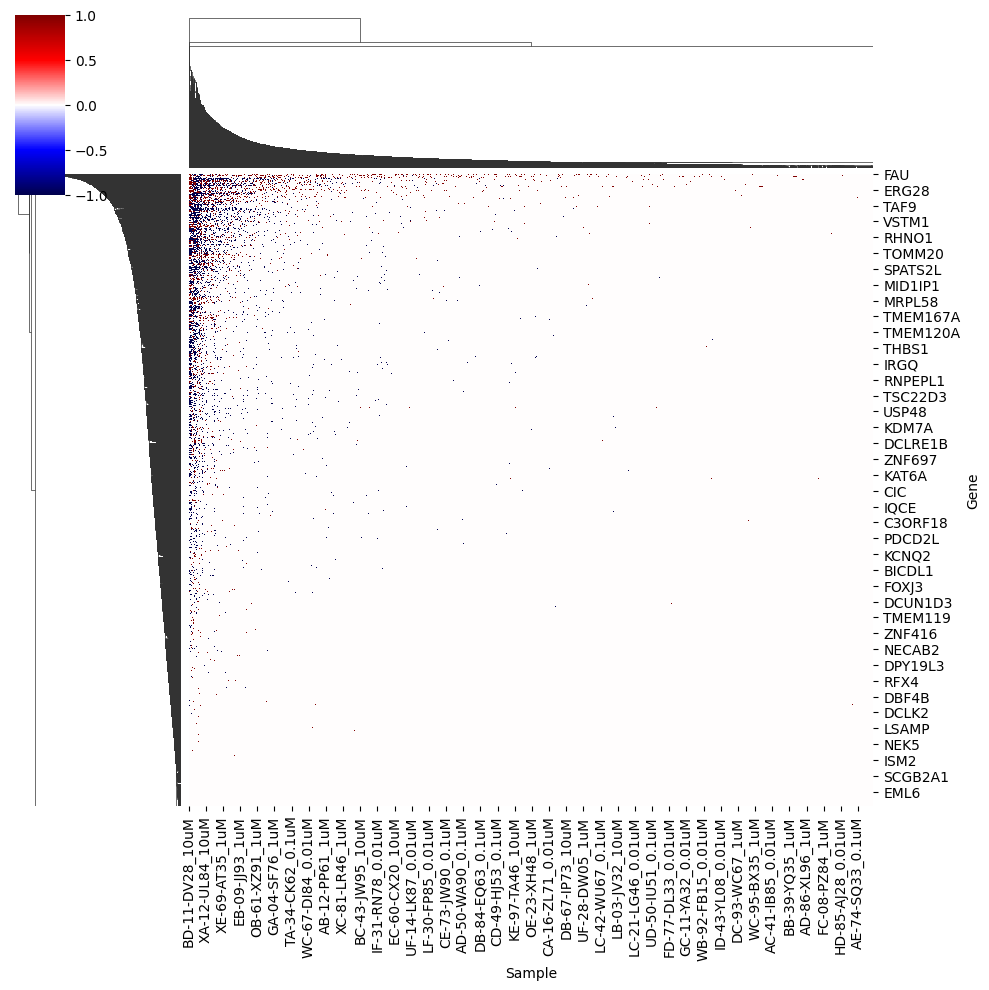

In [33]:
sns.clustermap(ternarymatrix, cmap='seismic', center=0)

### Gene Similarity Clustered Heatmap

/Users/ido/opt/anaconda3/envs/harmonizomeETL/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/Users/ido/opt/anaconda3/envs/harmonizomeETL/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


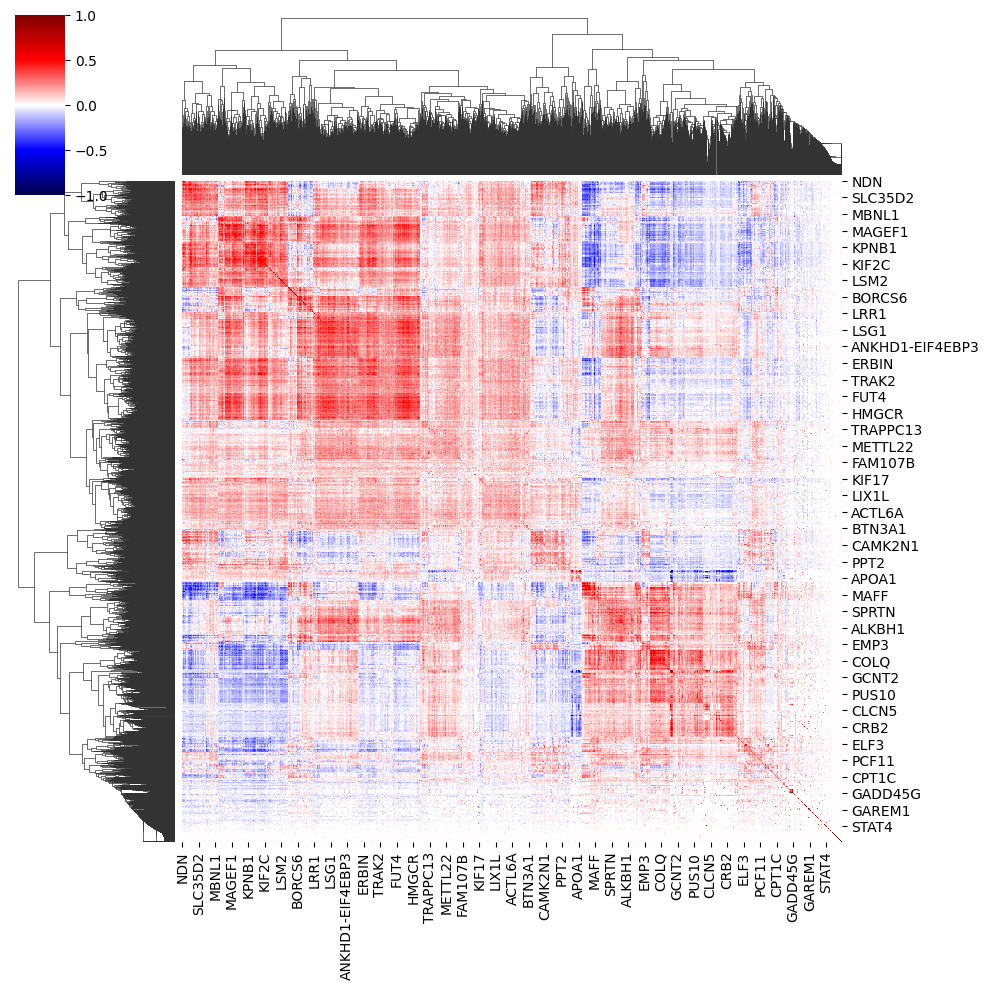

In [5]:
sns.clustermap(gene_similarity_matrix, cmap='seismic', center=0)

### Attribute Similarity Clustered Heatmap

/Users/ido/opt/anaconda3/envs/harmonizomeETL/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/Users/ido/opt/anaconda3/envs/harmonizomeETL/lib/python3.10/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


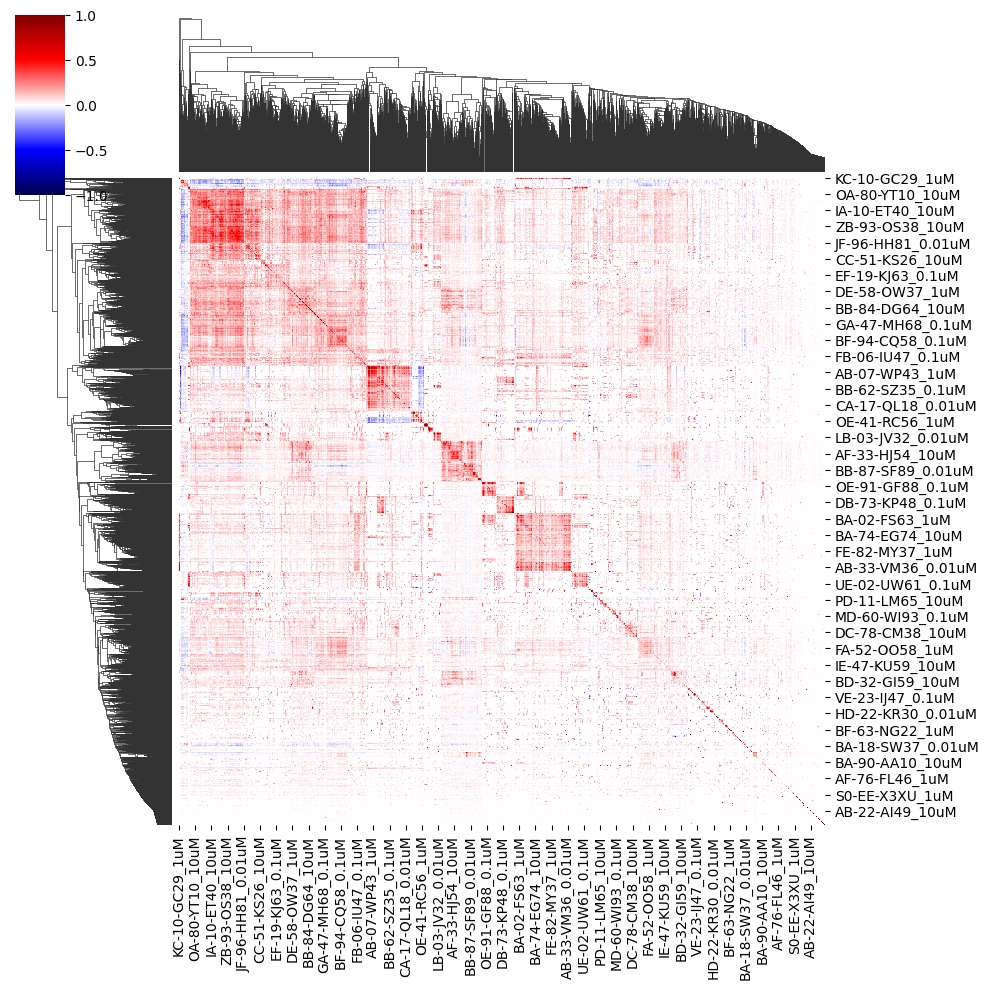

In [10]:
sns.clustermap(attribute_similarity_matrix, cmap='seismic', center=0)

### UMAP

In [14]:
def load_gmt(file):
    gmt = OrderedDict()
    for line in file:
        term, blank, *geneset = line.strip().split('\t')
        if 'consensus' not in term:
            term = f'{term}_up'
        gmt[term] = ' '.join(set(geneset))
    return gmt
libdict = load_gmt(open('downloads/gene_set_library_up_crisp.gmt', 'r'))
def load_gmt(file):
    gmt = OrderedDict()
    for line in file:
        term, blank, *geneset = line.strip().split('\t')
        gmt[f'{term}_down'] = ' '.join(set(geneset))
    return gmt
downlibdict = load_gmt(open('downloads/gene_set_library_dn_crisp.gmt', 'r'))
libdict.update(downlibdict)
scatterdir = 'images/'

In [18]:
def process_scatterplot(libdict, nneighbors=30, mindist=0.1, spread=1.0, maxdf=1.0, mindf=1):
    print("\tTF-IDF vectorizing gene set data...")
    vec = TfidfVectorizer(max_df=maxdf, min_df=mindf)
    X = vec.fit_transform(libdict.values())
    print(X.shape)
    adata = anndata.AnnData(X)
    adata.obs.index = libdict.keys()

    print("\tPerforming Leiden clustering...")
    ### the n_neighbors and min_dist parameters can be altered
    sc.pp.neighbors(adata, n_neighbors=nneighbors, use_rep='X')
    sc.tl.leiden(adata, resolution=1.0)
    sc.tl.umap(adata, min_dist=mindist, spread=spread, random_state=42)

    new_order = adata.obs.sort_values(by='leiden').index.tolist()
    adata = adata[new_order, :]
    adata.obs['leiden'] = 'Cluster ' + adata.obs['leiden'].astype('object')

    df = pd.DataFrame(adata.obsm['X_umap'])
    df.columns = ['x', 'y']

    df['cluster'] = adata.obs['leiden'].values
    df['term'] = adata.obs.index
    df['genes'] = [libdict[l] for l in df['term']]

    return df

In [19]:
def get_scatter_colors(df):
    clusters = pd.unique(df['cluster']).tolist()
    colors = list(Category20[20])[::2] + list(Category20[20])[1::2]
    color_mapper = {clusters[i]: colors[i % 20] for i in range(len(clusters))}
    return color_mapper

def get_scatterplot(scatterdf):
    df = scatterdf.copy()
    color_mapper = get_scatter_colors(df)
    df['color'] = df['cluster'].apply(lambda x: color_mapper[x])

    hover_emb = HoverTool(name="df", tooltips="""
        <div style="margin: 10">
            <div style="margin: 0 auto; width:300px;">
                <span style="font-size: 12px; font-weight: bold;">Gene Set:</span>
                <span style="font-size: 12px">@gene_set</span>
            <div style="margin: 0 auto; width:300px;">
                <span style="font-size: 12px; font-weight: bold;">Coordinates:</span>
                <span style="font-size: 12px">(@x,@y)</span>
            <div style="margin: 0 auto; width:300px;">
                <span style="font-size: 12px; font-weight: bold;">Cluster:</span>
                <span style="font-size: 12px">@cluster</span>
            </div>
        </div>
    """)
    tools_emb = [hover_emb, 'pan', 'wheel_zoom', 'reset', 'save']

    plot_emb = figure(
        width=1000, 
        height=700, 
        tools=tools_emb
    )

    source = ColumnDataSource(
        data=dict(
            x = df['x'],
            y = df['y'],
            gene_set = df['term'],
            cluster = df['cluster'],
            colors = df['color'],
            label = df['cluster']
        )
    )

    # hide axis labels and grid lines
    plot_emb.xaxis.major_tick_line_color = None
    plot_emb.xaxis.minor_tick_line_color = None
    plot_emb.yaxis.major_tick_line_color = None
    plot_emb.yaxis.minor_tick_line_color = None
    plot_emb.xaxis.major_label_text_font_size = '0pt'
    plot_emb.yaxis.major_label_text_font_size = '0pt' 

    plot_emb.output_backend = "svg"    
    
    plot_emb.title = 'Gene Sets in the NIBR DRUG-seq U2OS MoA Box Gene Expression Profiles Library'
    plot_emb.xaxis.axis_label = "UMAP_1"
    plot_emb.yaxis.axis_label = "UMAP_2"
    plot_emb.xaxis.axis_label_text_font_style = 'normal'
    plot_emb.xaxis.axis_label_text_font_size = '18px'
    plot_emb.yaxis.axis_label_text_font_size = '18px'
    plot_emb.yaxis.axis_label_text_font_style = 'normal'
    plot_emb.title.align = 'center'
    plot_emb.title.text_font_size = '18px'
    
    s = plot_emb.scatter(
        'x', 
        'y', 
        size = 4, 
        source = source, 
        color = 'colors'
    )
    
    return plot_emb

In [20]:
## defaults: nneighbors=30, mindist=0.1, spread=1.0, maxdf=1.0, mindf=1
scatter_df = process_scatterplot(libdict, nneighbors=60,mindist=0.1
     #,spread=1.5 
     #,maxdf=0.5
     #,mindf=2
)

# Display Scatter Plot
plot = get_scatterplot(scatter_df)
output_notebook()
show(plot)

	TF-IDF vectorizing gene set data...
(18810, 12857)
	Performing Leiden clustering...
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/var/folders/rt/nqdq0c4n0qn85yvwrldftq480000gn/T/ipykernel_5335/3064704780.py:17: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['leiden'] = 'Cluster ' + adata.obs['leiden'].astype('object')


Loading BokehJS ...

In [21]:
output_file(filename=f"{scatterdir}/umap.html", title = 'Gene Sets in NIBR DRUG-seq U2OS MoA Box Gene Expression Profiles Library')
save(plot)

'/Users/ido/Documents/harmonizome/newdata/Novartis/images/umap.html'